# Unsupervised Learning Mini Project

## Problem Statement:
Based on given data of visitors browsing for online shopping, build different clusters to know whether person is only browsing and visiting multiples pages or also generating revenue for the shoppers as well.  Analyse and compare the clusters formed with the existing Revenue Column.

In [1]:
# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from yellowbrick.cluster import silhouette_visualizer

from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cophenet
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.cluster import AgglomerativeClustering

from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

In [2]:
df= pd.read_csv('online_shoppers_intention.csv')

print("Shape of the Dataset:", df.shape)
df.head()

Shape of the Dataset: (12330, 18)


,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


* The dataset consists of feature vectors belonging to 12,330 sessions. The dataset was formed so that each session would belong to a different user in a 1-year period to avoid any tendency to a specific campaign, special day, user profile, or period.

In [3]:
# Checking the datatypes of the variables.

print("Datatypes:")
df.dtypes

# Some datatypes are not as per the data definition.

Datatypes:


Administrative               int64
Administrative_Duration    float64
Informational                int64
Informational_Duration     float64
ProductRelated               int64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                       object
OperatingSystems             int64
Browser                      int64
Region                       int64
TrafficType                  int64
VisitorType                 object
Weekend                       bool
Revenue                       bool
dtype: object

* The dataset consists of 10 numerical and 8 categorical attributes.
The 'Revenue' attribute can be used as the class label.

In [4]:
num_cols= df.iloc[:,:10]
cat_cols= df.iloc[:,10:]

In [5]:
# Changing the datatype of the categorical variables.

for i in cat_cols.columns:
    df[i]= df[i].astype(object)

In [6]:
# Checking the datatypes again.

print("Datatypes:")
df.dtypes

Datatypes:


Administrative               int64
Administrative_Duration    float64
Informational                int64
Informational_Duration     float64
ProductRelated               int64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                       object
OperatingSystems            object
Browser                     object
Region                      object
TrafficType                 object
VisitorType                 object
Weekend                     object
Revenue                     object
dtype: object

In [7]:
num_cols= df.iloc[:,:10]
cat_cols= df.iloc[:,10:]

## Data Analysis

### Summary

In [8]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000


In [9]:
df.describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,12330,12330,12330,12330,12330,12330,12330,12330
unique,10,8,13,9,20,3,2,2
top,May,2,2,1,2,Returning_Visitor,False,False
freq,3364,6601,7961,4780,3913,10551,9462,10422


### Univariate Analysis

#### Numerical Columns

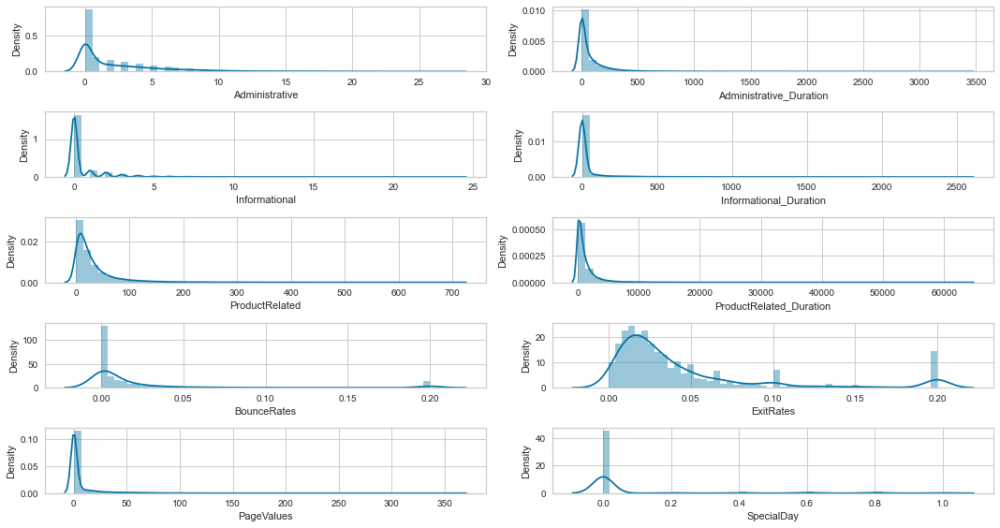

In [10]:
plt.figure(figsize=(15,8))
for i,j in enumerate(num_cols.columns):
    plt.subplot(5,2,i+1)
    sns.distplot(df[j])
    
plt.tight_layout()
plt.show()

<b>Inference:</b>
* All the numerical variables are positively skewed.

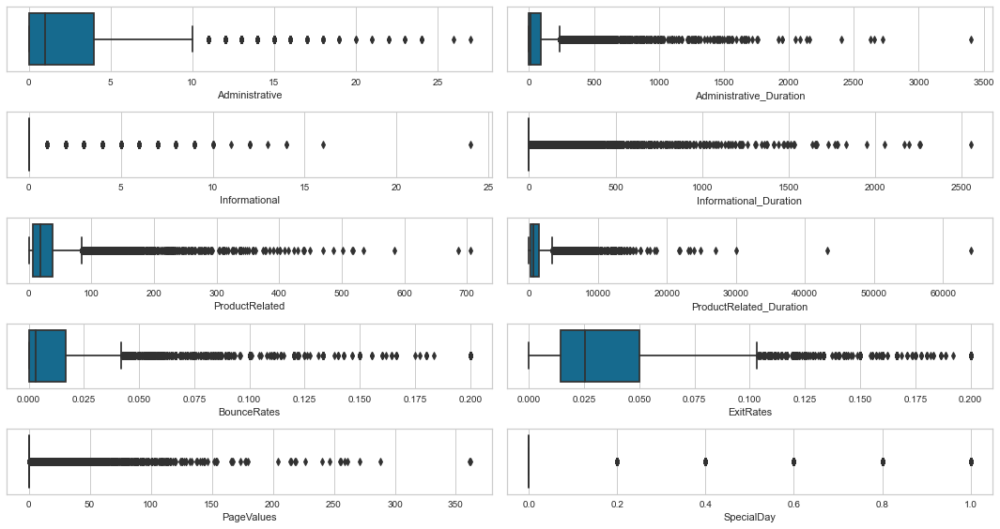

In [11]:
plt.figure(figsize=(15,8))
for i,j in enumerate(num_cols.columns):
    plt.subplot(5,2,i+1)
    sns.boxplot(df[j])
    
plt.tight_layout()
plt.show()

<b>Inference:</b>
* Outliers detected in all the numerical variables.

#### Categorical Columns

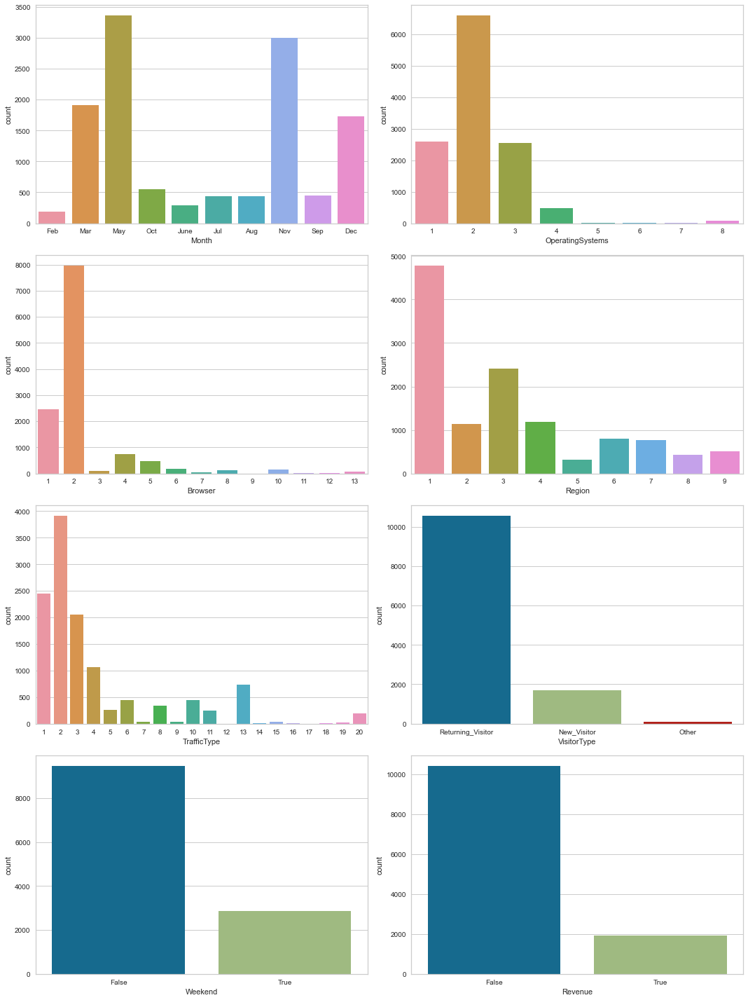

In [12]:
plt.figure(figsize=(15,20))
for i,j in enumerate(cat_cols.columns):
    plt.subplot(4,2,i+1)
    sns.countplot(df[j])
    
plt.tight_layout()
plt.show()

<b>Inference:</b>
* Highest traffic on the website was seen in the Month of May followed by November.
* Most people accessed the website using the 2nd Operating System.
* The 2nd browser was used the most to access the website.
* Most people using the website were from the 1st region and the least traffic was from the 5th region.
* Most of the traffic was of Returning Visitors.

### Bivariate Analysis

<Figure size 1080x1440 with 0 Axes>

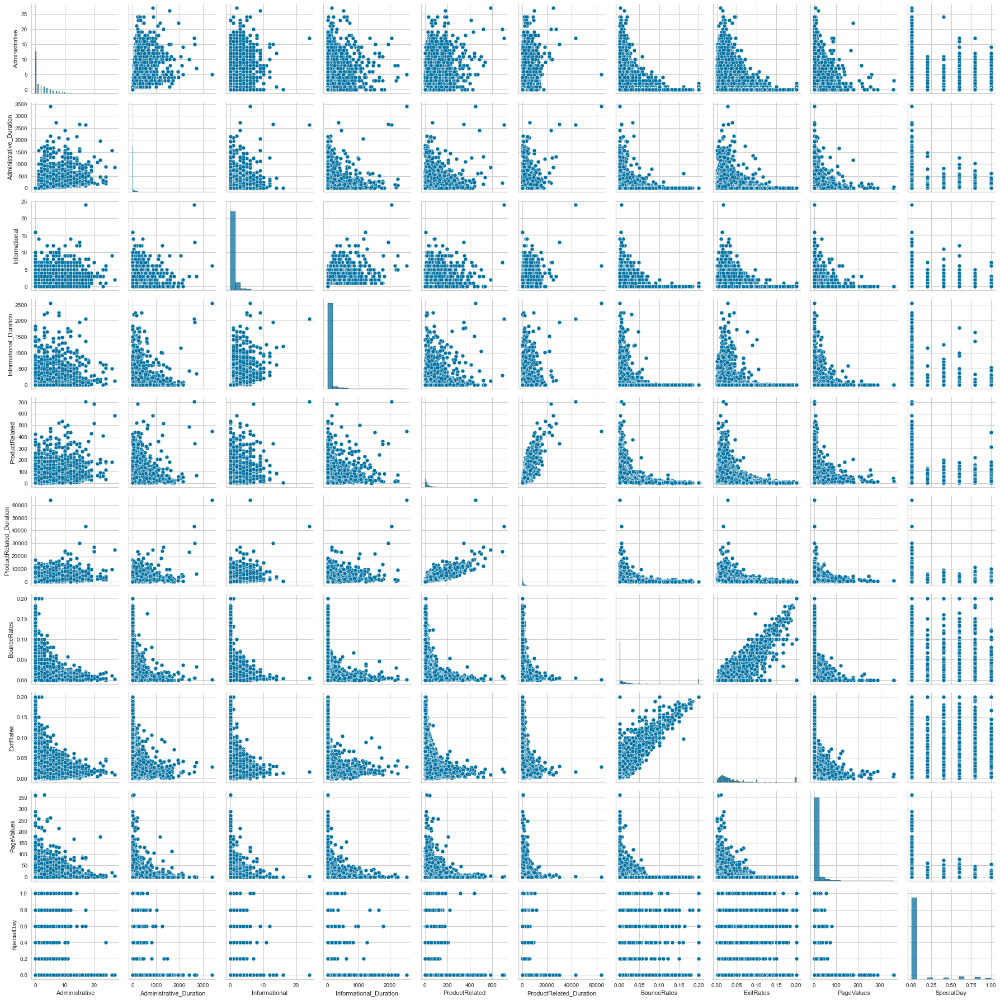

In [13]:
plt.figure(figsize=(15,20))
sns.pairplot(num_cols)
plt.tight_layout()
plt.show()

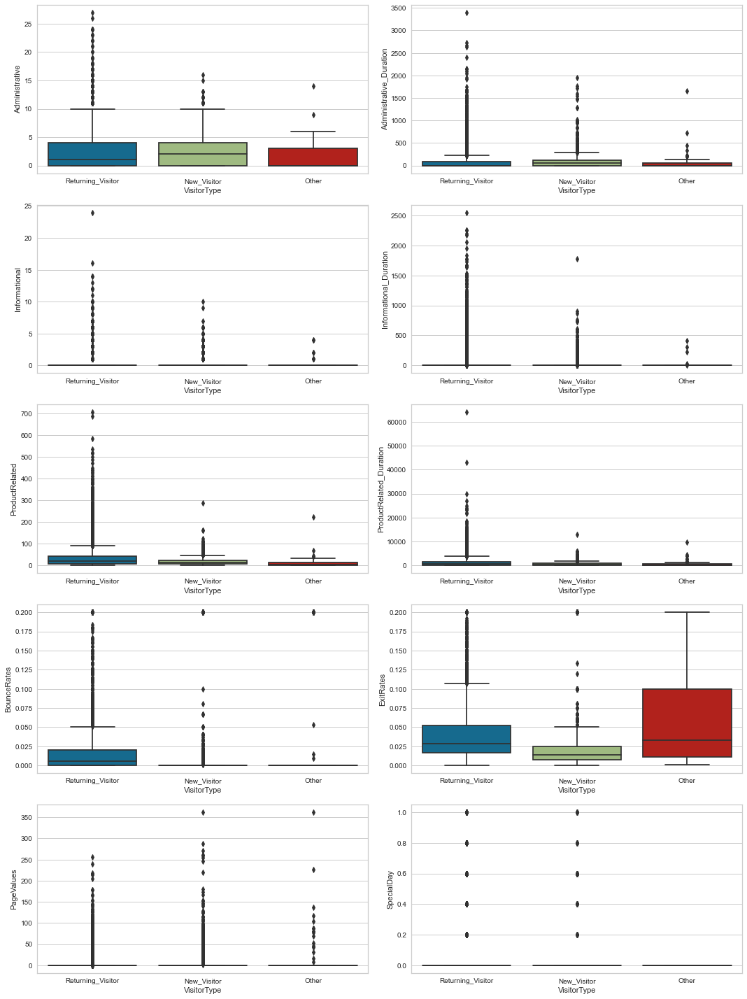

In [14]:
plt.figure(figsize=(15,20))
for i,j in enumerate(num_cols):
    plt.subplot(5,2,i+1)
    sns.boxplot(df['VisitorType'], df[j])
    
plt.tight_layout()
plt.show()

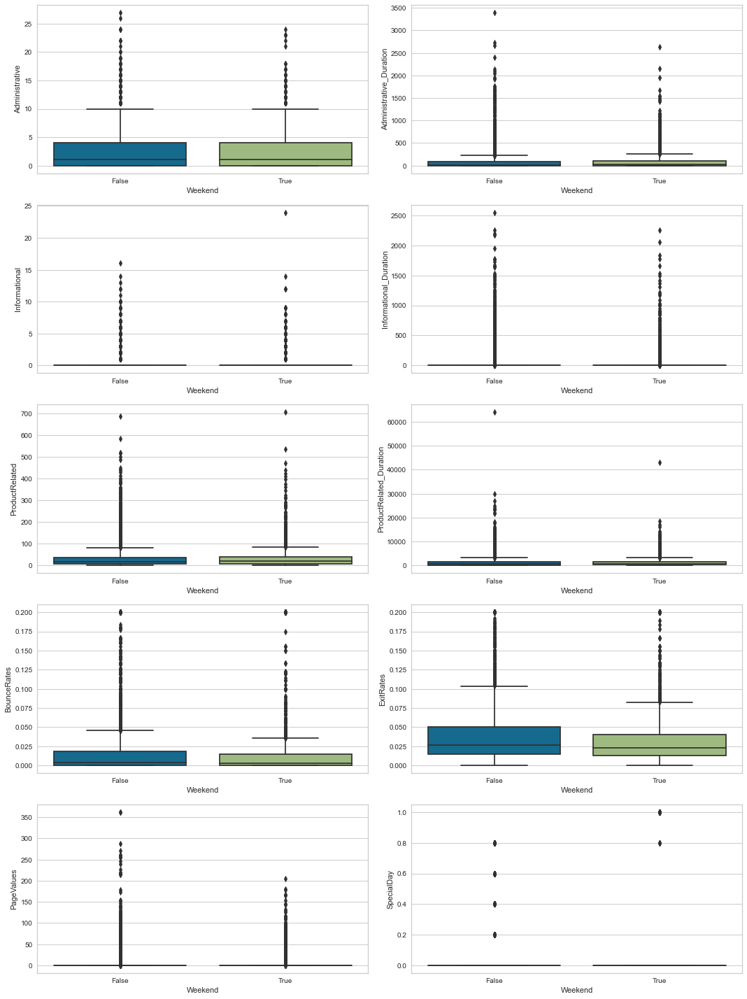

In [15]:
plt.figure(figsize=(15,20))
for i,j in enumerate(num_cols):
    plt.subplot(5,2,i+1)
    sns.boxplot(df['Weekend'], df[j])
    
plt.tight_layout()
plt.show()

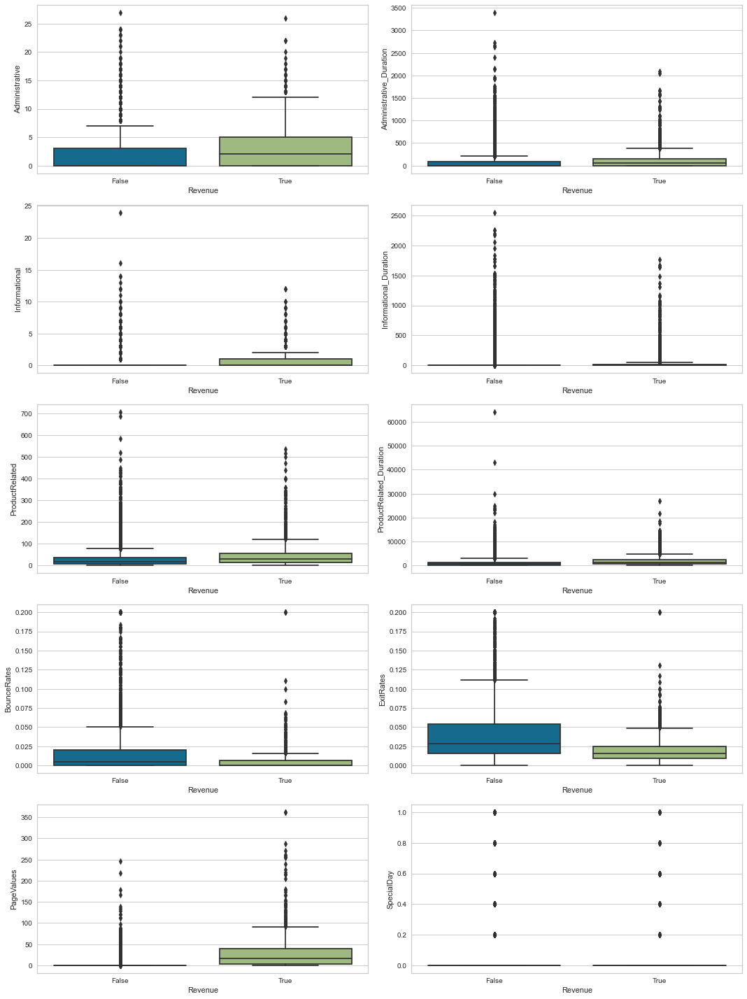

In [16]:
plt.figure(figsize=(15,20))
for i,j in enumerate(num_cols):
    plt.subplot(5,2,i+1)
    sns.boxplot(df['Revenue'], df[j])
    
plt.tight_layout()
plt.show()

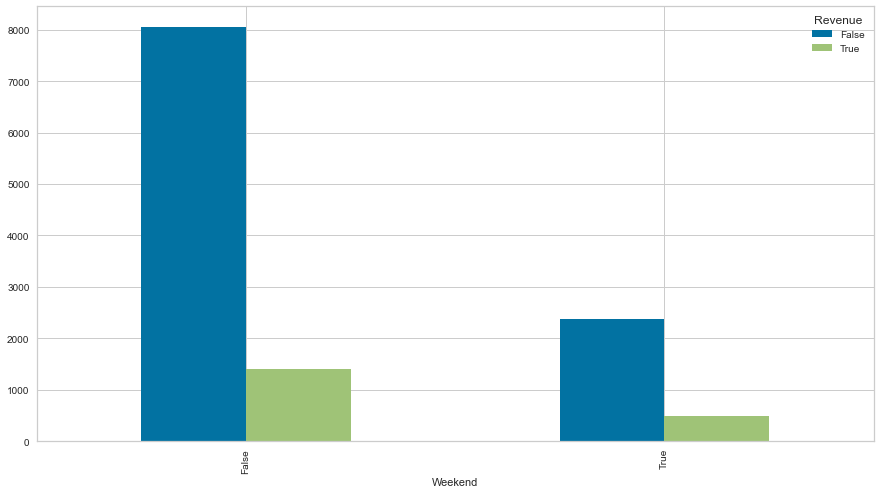

In [17]:
pd.crosstab(df['Weekend'],df['Revenue']).plot(kind= 'bar', figsize= (15,8))
plt.show()

<b>Inference:</b>
* More traffic visited the website on weekdays and more sale was made on the weekdays.

### Correlation Analysis

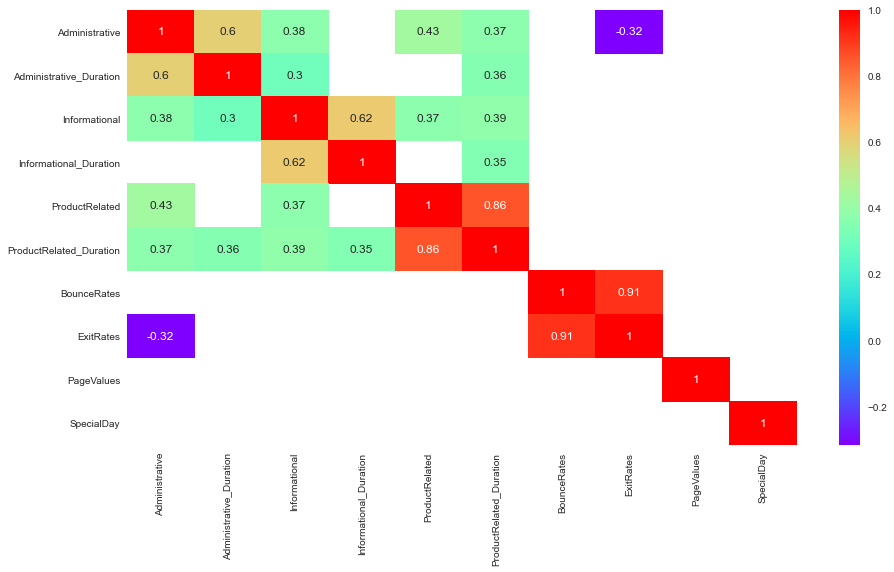

In [18]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr()[(df.corr() > 0.3)|(df.corr() < -0.3)], annot= True, cmap= 'rainbow')
plt.show()

<b>Inference:</b>
* High and Moderate Correlation between some variables found.

## Data PreProcessing

### Missing Value Treatment

In [19]:
df.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

<b>Interpretation:</b> The above output shows that there are no missing values in the data.

### Outlier Treatment

In [20]:
Q1= num_cols.quantile(0.25)
Q3= num_cols.quantile(0.75)

IQR= Q3 - Q1
UL= Q3 + (1.5*IQR)
LL= Q1 - (1.5*IQR)

df_out= num_cols[~((num_cols<LL) | (num_cols>UL)).any(axis= 1)]

df_out.reset_index(inplace= True, drop= True)

print("Shape of the Data after removing the outliers:", df_out.shape)

# But removing outliers this way is making all the values in four variables equal to 0.

Shape of the Data after removing the outliers: (5258, 10)


* But removing outliers this way is making all the values in `Informational`, `Informational_Duration`, `PageValues` and `SpecialDay` equal to 0.
* So, we will not consider these four variables to calculate outliers.

In [21]:
num_4= num_cols.drop(['Informational','Informational_Duration','PageValues','SpecialDay'], axis= 1)

Q1= num_4.quantile(0.25)
Q3= num_4.quantile(0.75)

IQR= Q3 - Q1
UL= Q3 + (1.5*IQR)
LL= Q1 - (1.5*IQR)

df_final= df[~((num_cols<LL) | (num_cols>UL)).any(axis= 1)]

df_final.reset_index(inplace= True, drop= True)

df_num= df_final.select_dtypes(np.number)

print("Shape of the Data after removing the outliers:", df_final.shape)

Shape of the Data after removing the outliers: (8591, 18)


### Scaling The Numerical Variables

In [22]:
# Scaling the Numerical Columns with Outliers removed.

ss= StandardScaler()
df_out_sc= pd.DataFrame(ss.fit_transform(df_out), columns= df_out.columns)

In [23]:
df_out_sc.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay
count,5.258000e+03,5.258000e+03,5258.0,5258.0,5.258000e+03,5.258000e+03,5.258000e+03,5.258000e+03,5258.0,5258.0
mean,-2.275260e-15,-1.747894e-15,0.0,0.0,-4.366990e-16,1.262673e-16,3.390931e-15,1.652032e-16,0.0,0.0
std,1.000095e+00,1.000095e+00,0.0,0.0,1.000095e+00,1.000095e+00,1.000095e+00,1.000095e+00,0.0,0.0
min,-6.639618e-01,-6.162881e-01,0.0,0.0,-1.136585e+00,-9.595241e-01,-6.150190e-01,-1.369797e+00,0.0,0.0
25%,-6.639618e-01,-6.162881e-01,0.0,0.0,-7.030583e-01,-7.175015e-01,-6.150190e-01,-7.637564e-01,0.0,0.0
50%,-6.639618e-01,-6.162881e-01,0.0,0.0,-3.314642e-01,-3.541851e-01,-6.150190e-01,-2.406597e-01,0.0,0.0
75%,3.292419e-01,3.466619e-01,0.0,0.0,4.117242e-01,3.608268e-01,3.752082e-01,5.120985e-01,0.0,0.0
max,4.302057e+00,3.901195e+00,0.0,0.0,4.065733e+00,4.136448e+00,3.412874e+00,2.864468e+00,0.0,0.0


In [24]:
df_num= pd.DataFrame(ss.fit_transform(df_num), columns= df_num.columns)

df_num.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay
count,8.591000e+03,8.591000e+03,8.591000e+03,8.591000e+03,8.591000e+03,8.591000e+03,8.591000e+03,8.591000e+03,8.591000e+03,8.591000e+03
mean,2.249575e-15,5.759048e-16,1.458617e-15,3.015604e-17,2.168495e-16,-1.085281e-16,1.327925e-15,1.764002e-16,-2.738262e-15,-9.872779e-15
std,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00,1.000058e+00
min,-7.437104e-01,-7.005111e-01,-3.577251e-01,-2.116660e-01,-1.230852e+00,-1.077396e+00,-6.408811e-01,-1.342759e+00,-3.180693e-01,-2.949051e-01
25%,-7.437104e-01,-7.005111e-01,-3.577251e-01,-2.116660e-01,-7.845774e-01,-7.733710e-01,-6.408811e-01,-7.374021e-01,-3.180693e-01,-2.949051e-01
50%,-3.081216e-01,-6.303225e-01,-3.577251e-01,-2.116660e-01,-2.825188e-01,-3.185242e-01,-6.408811e-01,-2.421097e-01,-3.180693e-01,-2.949051e-01
75%,5.630559e-01,4.533303e-01,-3.577251e-01,-2.116660e-01,4.984613e-01,4.930678e-01,3.995252e-01,4.733126e-01,-3.180693e-01,-2.949051e-01
max,3.612177e+00,3.389435e+00,1.564340e+01,2.155603e+01,3.455029e+00,3.571846e+00,3.504932e+00,3.197421e+00,1.782658e+01,4.939661e+00


**Interpretation:** Mean of all variables is now equal to 0 and Standard Deviation of all variables is now equal to 1.

## Cluster Analysis

### K-Means Clustering

In [25]:
wcss= []

for i in range(1,21):
    kmeans= KMeans(n_clusters= i, random_state= 5)
    kmeans.fit(df_num)
    wcss.append(kmeans.inertia_)

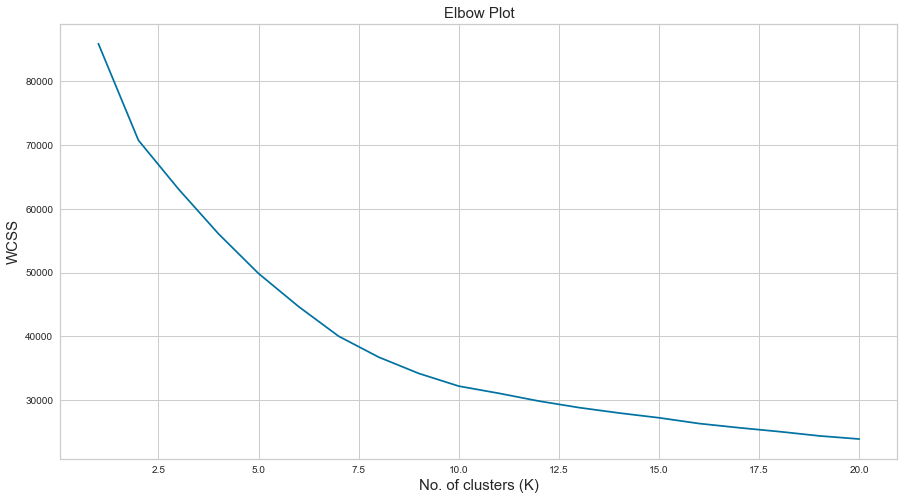

In [26]:
# Elbow Plot Analysis

plt.figure(figsize=(15,8))

plt.plot(range(1,21), wcss)
plt.title('Elbow Plot', fontsize = 15)
plt.xlabel('No. of clusters (K)', fontsize = 15)
plt.ylabel('WCSS', fontsize = 15)

plt.show()

**Interpretation:** 
* According to the Elbow Plot, K=2,7 is the optimal value. But it is still inconclusive.
* So, we will try to find out the optimal value of K using silhouette score method.

In [27]:
num_cols_sc= pd.DataFrame(ss.fit_transform(num_cols), columns= num_cols.columns)

In [28]:
# Silhouette Score Method
# For the raw data with outliers.

for K in range(2,11):
    cluster= KMeans(n_clusters= K, random_state= 5)
    predict= cluster.fit_predict(num_cols_sc)
    score= silhouette_score(num_cols_sc, predict, random_state= 5)
    print("For {} clusters the silhouette score is {}".format(K, score))

For 2 clusters the silhouette score is 0.4359240066762132
For 3 clusters the silhouette score is 0.45167239219137933
For 4 clusters the silhouette score is 0.430368103697389
For 5 clusters the silhouette score is 0.39786556909495274
For 6 clusters the silhouette score is 0.40756614436390265
For 7 clusters the silhouette score is 0.4079728995539923
For 8 clusters the silhouette score is 0.37233763525402797
For 9 clusters the silhouette score is 0.35354603952172314
For 10 clusters the silhouette score is 0.3498295710163234


In [29]:
# Silhouette Score Method

for K in range(2,11):
    cluster= KMeans(n_clusters= K, random_state= 5)
    predict= cluster.fit_predict(df_num)
    score= silhouette_score(df_num, predict, random_state= 5)
    print("For {} clusters the silhouette score is {}".format(K, score))

For 2 clusters the silhouette score is 0.2458781662090961
For 3 clusters the silhouette score is 0.21813774106264366
For 4 clusters the silhouette score is 0.2460411154906934
For 5 clusters the silhouette score is 0.24126404845135346
For 6 clusters the silhouette score is 0.23987329941823413
For 7 clusters the silhouette score is 0.23802883449678344
For 8 clusters the silhouette score is 0.239281990241929
For 9 clusters the silhouette score is 0.24399192262832117
For 10 clusters the silhouette score is 0.2395327182585003


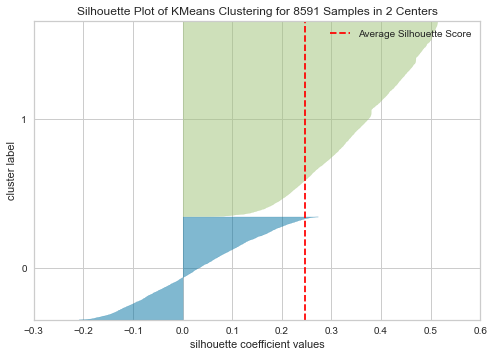

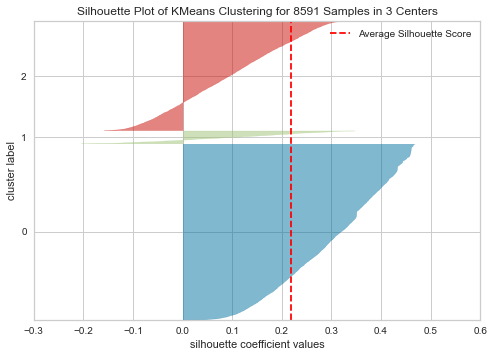

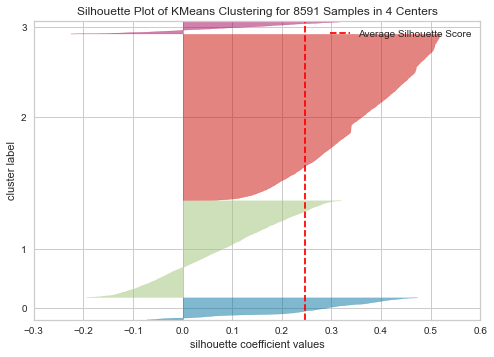

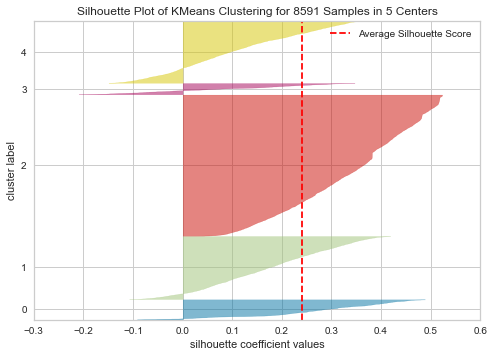

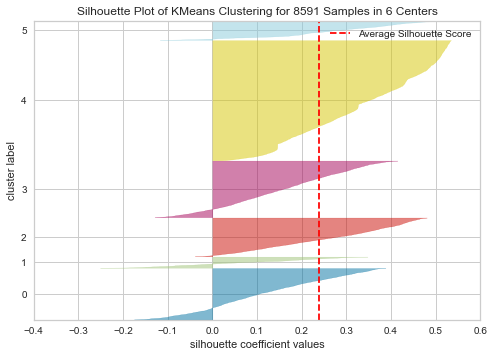

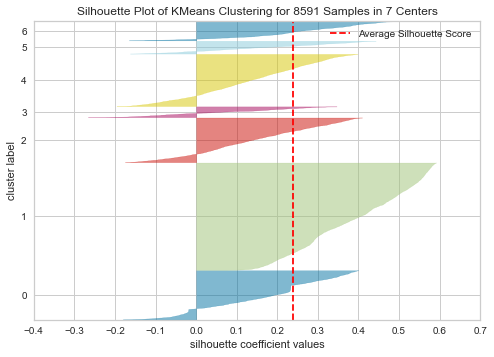

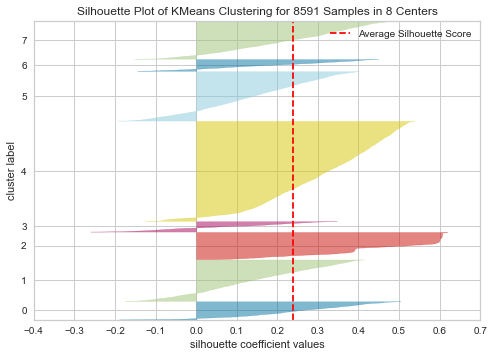

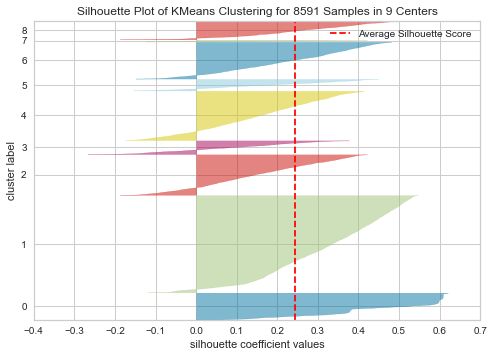

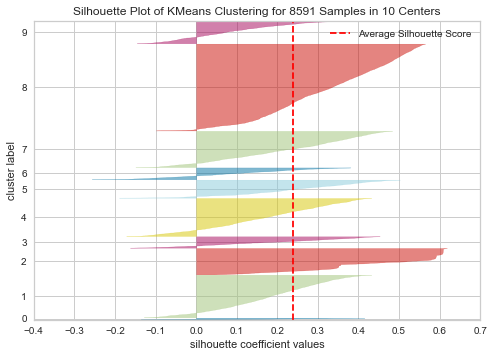

In [30]:
for i in range(2,11):
    silhouette_visualizer(KMeans(i, random_state= 5), df_num, colors= 'yellowbrick')

**Interpretation:** For 4 Clusters, the Silhouette Score is maximum (0.2460)

In [31]:
# Building a K-Means model with 4 Clusters.

k_clusters= KMeans(n_clusters= 4, random_state= 5)

k_clusters.fit(df_num)

df_final['Cluster KMeans']= k_clusters.labels_

In [32]:
df_final['Cluster KMeans'].value_counts()

2    4801
1    2795
0     639
3     356
Name: Cluster KMeans, dtype: int64

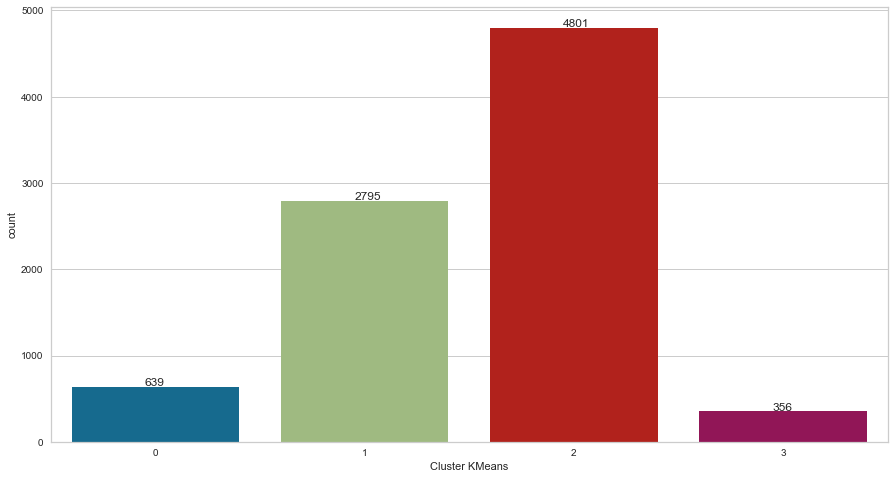

In [33]:
plt.figure(figsize=(15,8))

sns.countplot(df_final['Cluster KMeans'])

plt.text(x=-0.05, y= df_final['Cluster KMeans'].value_counts()[0]+10, s= df_final['Cluster KMeans'].value_counts()[0])
plt.text(x=0.95, y= df_final['Cluster KMeans'].value_counts()[1]+10, s= df_final['Cluster KMeans'].value_counts()[1])
plt.text(x=1.95, y= df_final['Cluster KMeans'].value_counts()[2]+10, s= df_final['Cluster KMeans'].value_counts()[2])
plt.text(x=2.95, y= df_final['Cluster KMeans'].value_counts()[3]+10, s= df_final['Cluster KMeans'].value_counts()[3])

plt.show()

#### Cluster 1

In [34]:
df_final[df_final['Cluster KMeans']==0].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans
count,639.000000,639.000000,639.000000,639.000000,639.000000,639.000000,639.000000,639.000000,639.000000,639.000000,639.0
mean,0.765258,13.757001,0.165884,6.073251,22.314554,723.076854,0.010575,0.039057,2.186270,0.685133,0.0
std,1.568093,31.262851,0.525846,29.763123,17.926084,687.120580,0.012345,0.022970,8.073922,0.196237,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000833,0.000000,0.400000,0.0
25%,0.000000,0.000000,0.000000,0.000000,8.000000,188.875000,0.000000,0.022222,0.000000,0.600000,0.0
50%,0.000000,0.000000,0.000000,0.000000,18.000000,502.466667,0.005952,0.034896,0.000000,0.600000,0.0
75%,1.000000,8.000000,0.000000,0.000000,31.000000,1010.750000,0.018804,0.051770,0.000000,0.800000,0.0
max,10.000000,200.583333,5.000000,330.000000,82.000000,3357.340476,0.041667,0.100000,72.788000,1.000000,0.0


In [35]:
df_final[df_final['Cluster KMeans']==0].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,639,639,639,639,639,639,639,639
unique,2,7,9,9,13,2,2,2
top,May,2,2,1,3,Returning_Visitor,False,False
freq,596,395,409,243,161,600,535,594


#### Cluster 2

In [36]:
df_final[df_final['Cluster KMeans']==1].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans
count,2795.000000,2795.000000,2795.000000,2795.000000,2795.000000,2795.000000,2795.000000,2795.000000,2795.000000,2795.000000,2795.0
mean,3.559213,88.291356,0.355993,11.873270,34.629696,1262.579304,0.004753,0.017884,11.512849,0.008157,1.0
std,2.499603,63.169866,0.715607,33.361361,19.589595,813.018675,0.007465,0.012226,28.473739,0.055782,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,2.000000,37.125000,0.000000,0.000000,19.000000,597.965336,0.000000,0.008889,0.000000,0.000000,1.0
50%,3.000000,81.600000,0.000000,0.000000,32.000000,1141.061905,0.000000,0.015417,0.000000,0.000000,1.0
75%,5.000000,134.375000,0.000000,0.000000,48.000000,1807.755833,0.007166,0.024004,10.238928,0.000000,1.0
max,10.000000,233.083333,3.000000,294.000000,84.000000,3382.083333,0.041945,0.093750,361.763742,0.600000,1.0


In [37]:
df_final[df_final['Cluster KMeans']==1].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,2795,2795,2795,2795,2795,2795,2795,2795
unique,10,7,12,9,18,3,2,2
top,Nov,2,2,1,2,Returning_Visitor,False,False
freq,714,1561,1812,1028,1118,2190,2054,2133


#### Cluster 3

In [38]:
df_final[df_final['Cluster KMeans']==2].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans
count,4801.000000,4801.000000,4801.000000,4801.000000,4801.000000,4801.000000,4801.000000,4801.000000,4801.000000,4801.000000,4801.0
mean,0.594876,11.639679,0.126015,3.846279,13.894605,479.684791,0.006931,0.035655,3.752643,0.003374,2.0
std,1.076165,24.455944,0.467877,21.106687,10.501971,458.401094,0.011009,0.023730,13.656696,0.026082,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0
25%,0.000000,0.000000,0.000000,0.000000,6.000000,139.500000,0.000000,0.018182,0.000000,0.000000,2.0
50%,0.000000,0.000000,0.000000,0.000000,11.000000,334.785714,0.000000,0.030952,0.000000,0.000000,2.0
75%,1.000000,10.500000,0.000000,0.000000,19.000000,681.500000,0.012500,0.050000,0.000000,0.000000,2.0
max,7.000000,202.000000,4.000000,324.500000,69.000000,3291.000000,0.041844,0.100000,179.307293,0.400000,2.0


In [39]:
df_final[df_final['Cluster KMeans']==2].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,4801,4801,4801,4801,4801,4801,4801,4801
unique,10,8,12,9,19,3,2,2
top,Nov,2,2,1,2,Returning_Visitor,False,False
freq,1127,2568,2982,1867,1460,3967,3679,4252


#### Cluster 4

In [40]:
df_final[df_final['Cluster KMeans']==3].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans
count,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.0
mean,3.862360,88.539012,3.839888,372.463496,33.143258,1233.913801,0.006713,0.022354,8.114392,0.020225,3.0
std,2.880853,67.128329,1.938399,337.279424,20.460177,805.445527,0.008331,0.014536,16.264370,0.105275,0.0
min,0.000000,0.000000,1.000000,8.000000,1.000000,17.000000,0.000000,0.000000,0.000000,0.000000,3.0
25%,1.000000,26.357143,3.000000,161.850000,16.750000,566.438988,0.000000,0.011740,0.000000,0.000000,3.0
50%,3.000000,82.550000,4.000000,270.000000,29.000000,1120.346840,0.003813,0.019265,0.000000,0.000000,3.0
75%,6.000000,141.562500,5.000000,466.900000,47.000000,1807.381345,0.010781,0.030867,9.559938,0.000000,3.0
max,10.000000,229.333333,16.000000,2252.033333,84.000000,3313.073936,0.038889,0.100000,154.095539,0.800000,3.0


In [41]:
df_final[df_final['Cluster KMeans']==3].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,356,356,356,356,356,356,356,356
unique,9,5,10,9,14,3,2,2
top,Nov,2,2,1,2,Returning_Visitor,False,False
freq,89,185,238,146,193,304,263,276


**Interpretation:** When we fit a model with 4 clusters, Cluster 1 and 3 give very similar results. Also, Cluster 2 and 4 give very similar results. \
So, we will fit a model with 2 Clusters as it has the highest silhouette score after model with 4 clusters.

In [42]:
# Building a K-Means model with 2 Clusters.

k_clusters= KMeans(n_clusters= 2, random_state= 5)

k_clusters.fit(df_num)

df_final['Cluster KMeans 2']= k_clusters.labels_

In [43]:
df_final['Cluster KMeans 2'].value_counts()

1    5621
0    2970
Name: Cluster KMeans 2, dtype: int64

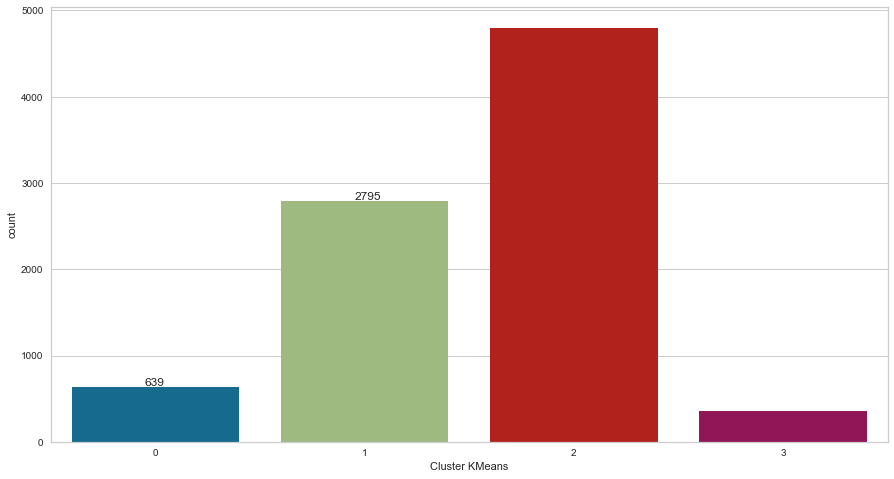

In [44]:
plt.figure(figsize=(15,8))

sns.countplot(df_final['Cluster KMeans'])

plt.text(x=-0.05, y= df_final['Cluster KMeans'].value_counts()[0]+10, s= df_final['Cluster KMeans'].value_counts()[0])
plt.text(x=0.95, y= df_final['Cluster KMeans'].value_counts()[1]+10, s= df_final['Cluster KMeans'].value_counts()[1])

plt.show()

#### Cluster 1

In [45]:
df_final[df_final['Cluster KMeans 2']==0].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans,Cluster KMeans 2
count,2970.000000,2970.000000,2970.000000,2970.000000,2970.000000,2970.000000,2970.000000,2970.000000,2970.000000,2970.000000,2970.000000,2970.0
mean,3.699663,90.126255,0.833670,56.498430,36.117845,1321.343856,0.005440,0.018811,10.358079,0.030976,1.218182,0.0
std,2.585819,64.236760,1.482108,167.509079,19.798316,815.929457,0.007875,0.012794,26.088182,0.138741,0.681917,0.0
min,0.000000,0.000000,0.000000,0.000000,1.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,2.000000,38.500000,0.000000,0.000000,21.000000,661.422421,0.000000,0.009340,0.000000,0.000000,1.000000,0.0
50%,3.000000,84.385417,0.000000,0.000000,33.000000,1217.378809,0.001347,0.016274,0.000000,0.000000,1.000000,0.0
75%,5.000000,138.500000,1.000000,29.729167,50.000000,1894.208002,0.008333,0.025369,9.432479,0.000000,1.000000,0.0
max,10.000000,233.083333,16.000000,2252.033333,84.000000,3382.083333,0.041945,0.100000,361.763742,1.000000,3.000000,0.0


In [46]:
df_final[df_final['Cluster KMeans 2']==0].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,2970,2970,2970,2970,2970,2970,2970,2970
unique,10,7,12,9,17,3,2,2
top,Nov,2,2,1,2,Returning_Visitor,False,False
freq,748,1627,1936,1116,1223,2413,2193,2299


**Interpretation:**
People in Cluster 1:
* visited almost 4 Administrative pages on an average for 90 seconds.
* visited almost 36 Product Related pages on an average for 1321 seconds.
* visited 10 pages on an average before completing an e-commerce transaction.

* So people in this cluster visited the Product Related pages more and stayed there for a longer period of time on an average.
* Also, on an average they visited more pages before completing an e-commerce transaction.

* Most of the people don't visit the Informational pages.

#### Cluster 2

In [47]:
df_final[df_final['Cluster KMeans 2']==1].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans,Cluster KMeans 2
count,5621.000000,5621.000000,5621.000000,5621.000000,5621.000000,5621.000000,5621.000000,5621.000000,5621.000000,5621.000000,5621.000000,5621.0
mean,0.654688,13.394783,0.106209,3.616661,14.639032,499.698276,0.007036,0.035263,4.219375,0.069738,1.751824,1.0
std,1.148165,27.367646,0.430094,23.903814,11.163956,473.069367,0.011083,0.023697,15.332237,0.212368,0.620640,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,0.000000,0.000000,0.000000,0.000000,6.000000,146.500000,0.000000,0.016783,0.000000,0.000000,2.000000,1.0
50%,0.000000,0.000000,0.000000,0.000000,12.000000,352.083333,0.000000,0.030357,0.000000,0.000000,2.000000,1.0
75%,1.000000,14.000000,0.000000,0.000000,20.000000,705.833333,0.012500,0.050000,0.000000,0.000000,2.000000,1.0
max,7.000000,202.000000,5.000000,686.000000,80.000000,3291.000000,0.041844,0.100000,270.784693,1.000000,3.000000,1.0


In [48]:
df_final[df_final['Cluster KMeans 2']==1].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,5621,5621,5621,5621,5621,5621,5621,5621
unique,10,8,12,9,19,3,2,2
top,May,2,2,1,2,Returning_Visitor,False,False
freq,1593,3082,3505,2168,1678,4648,4338,4956


**Interpretation:**
People in Cluster 2:
* visited almost 1 Administrative pages on an average for 13 seconds.
* visited almost 15 Product Related pages on an average for 500 seconds.
* visited 4 pages on an average before completing an e-commerce transaction.

* So people in this cluster visited the Product Related pages less and stayed there not for a long period of time on an average.
* Also, on an average they visited less pages before completing an e-commerce transaction.
* This could mean that they knew what they wanted before coming on the site.

* Most of the people don't visit the Informational pages.

<Figure size 1080x1440 with 0 Axes>

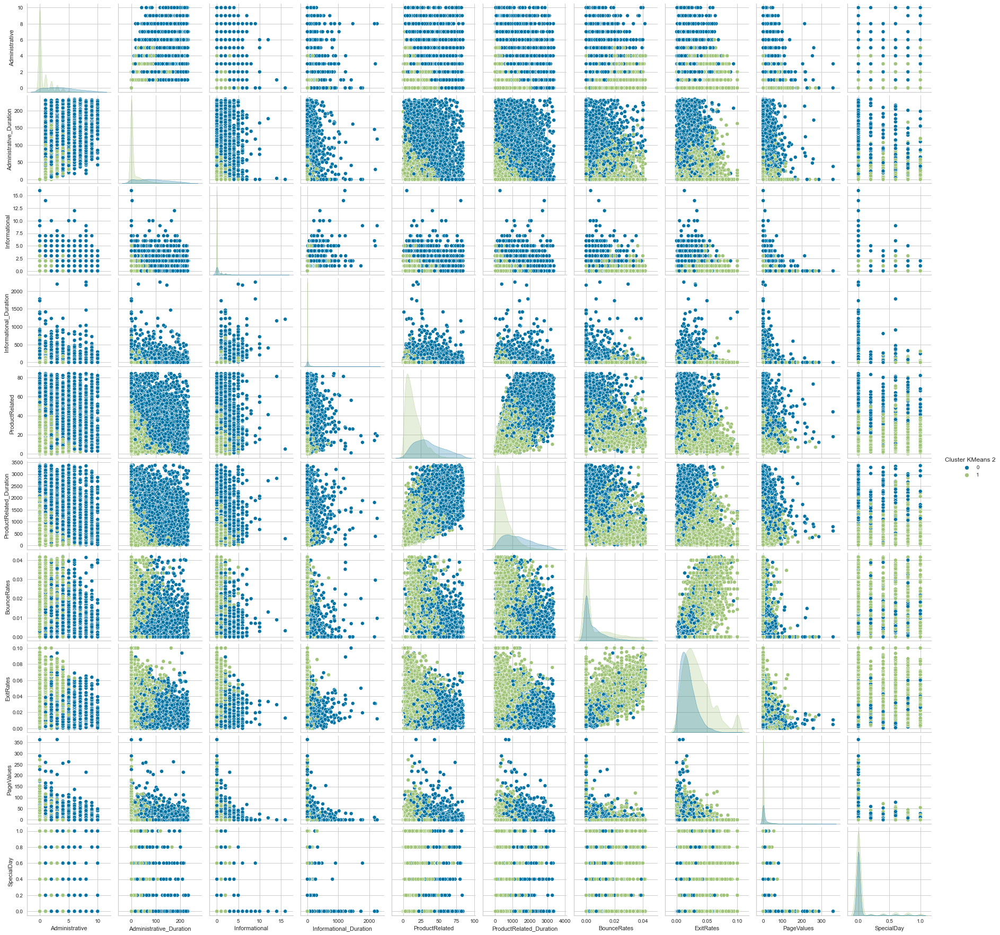

In [49]:
plt.figure(figsize= (15,20))
sns.pairplot(data= df_final.iloc[:, [0,1,2,3,4,5,6,7,8,9, 19]], hue= 'Cluster KMeans 2')
plt.show()

In [50]:
# For original data with outliers, 3 Clusters is the optimal amount as per Silhouette Score.

k_clusters= KMeans(n_clusters= 3, random_state= 5)

k_clusters.fit(num_cols_sc)

df['Cluster KMeans']= k_clusters.labels_

In [51]:
df['Cluster KMeans'].value_counts()

0    9652
2    1628
1    1050
Name: Cluster KMeans, dtype: int64

**Interpretation:** This model is probably not a good model as it is necessary for outliers to be removed before applying KMeans Clustering algorithm.

### Hierarchical Clustering

In [52]:
link_mat= linkage(df_num, method= 'ward')

link_mat

array([[1.20000000e+01, 1.25000000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.50000000e+01, 8.45700000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.70000000e+01, 2.34000000e+02, 0.00000000e+00, 2.00000000e+00],
       ...,
       [1.71740000e+04, 1.71770000e+04, 1.14302609e+02, 3.52800000e+03],
       [1.71670000e+04, 1.71750000e+04, 1.19801686e+02, 5.06300000e+03],
       [1.71780000e+04, 1.71790000e+04, 1.51309735e+02, 8.59100000e+03]])

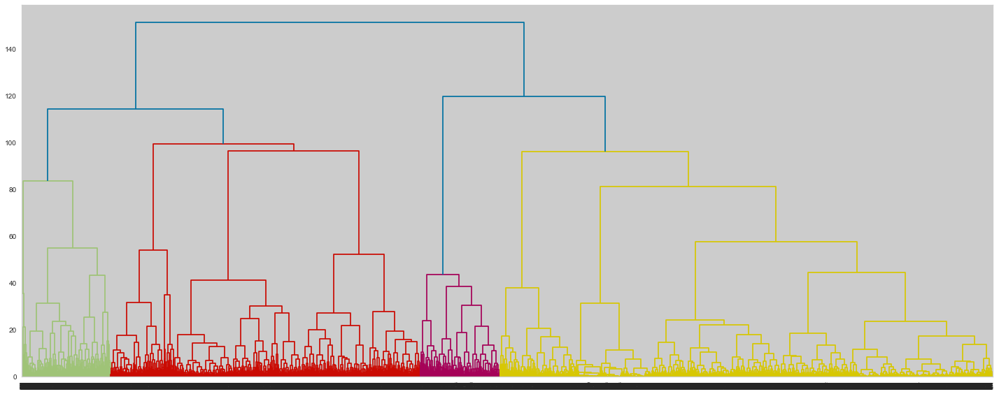

In [53]:
plt.figure(figsize= (20,8))
dendrogram(link_mat)
plt.tight_layout()
plt.show()

**Interpretation:** According to the dendrogram when 'ward' linkage method is used, Optimal number of clusters is 4.

In [54]:
# Checking for the best Cophenetic score.

for i in ['single', 'complete',  'average' , 'ward']:
    link_mat= linkage(df_num, method= i)
    euc_dist= euclidean_distances(df_num)
    dist_array= euc_dist[np.triu_indices(len(df_num), k= 1)]

    coeff, coph_dist= cophenet(link_mat, dist_array)
    print(str(i)+':', coeff)

single: 0.7690216093732235
complete: 0.6494464303934602
average: 0.8230417277235315
ward: 0.4266784991636553


**Interpretation:** Highest cophenetic score is achieved when 'average' linkage method is used.

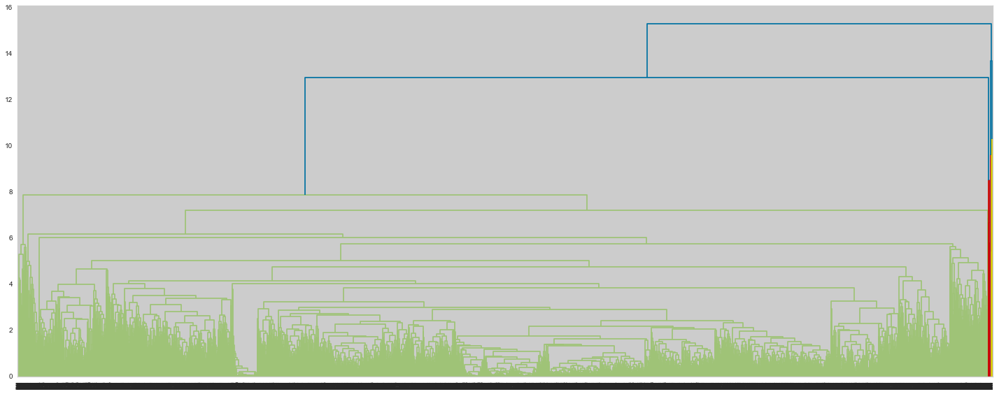

In [55]:
# Drawing the Dendrogram with 'average' linkage method.

link_mat= linkage(df_num, method= 'average')

plt.figure(figsize= (20,8))
dendrogram(link_mat)
plt.tight_layout()
plt.show()

**Interpretation:** According to the above diagram, the optimal number of clusters is 2.

In [56]:
# Silhouette Score Method

for K in range(2,11):
    cluster= AgglomerativeClustering(n_clusters= K)
    predict= cluster.fit_predict(df_num)
    score= silhouette_score(df_num, predict, random_state= 5)
    print("For {} clusters the silhouette score is {}".format(K, score))

For 2 clusters the silhouette score is 0.1780327367378115
For 3 clusters the silhouette score is 0.1888714279666359
For 4 clusters the silhouette score is 0.1913670211569097
For 5 clusters the silhouette score is 0.20447521941963728
For 6 clusters the silhouette score is 0.18227455980184348
For 7 clusters the silhouette score is 0.19096363785341383
For 8 clusters the silhouette score is 0.1967175250447346
For 9 clusters the silhouette score is 0.17980218767709277
For 10 clusters the silhouette score is 0.1449310960640679


**Interpretation:** When we use the 'ward' linkage method, Optimal number of clusters is 5 as per the Silhouette Score.

In [57]:
# Silhouette Score Method

for K in range(2,11):
    cluster= AgglomerativeClustering(n_clusters= K, linkage='average')
    predict= cluster.fit_predict(df_num)
    score= silhouette_score(df_num, predict, random_state= 5)
    print("For {} clusters the silhouette score is {}".format(K, score))

For 2 clusters the silhouette score is 0.7375565427424031
For 3 clusters the silhouette score is 0.7083099799830134
For 4 clusters the silhouette score is 0.6840982852419867
For 5 clusters the silhouette score is 0.6827927365811489
For 6 clusters the silhouette score is 0.6515928359084737
For 7 clusters the silhouette score is 0.6000206107610155
For 8 clusters the silhouette score is 0.5006710437782782
For 9 clusters the silhouette score is 0.44586178979665936
For 10 clusters the silhouette score is 0.44576947744123935


**Interpretation:** When we use the 'average' linkage method, Optimal number of clusters is 2 as per the Silhouette Score.

In [58]:
# Agg with outliers ward

for K in range(2,11):
    cluster= AgglomerativeClustering(n_clusters= K)
    predict= cluster.fit_predict(num_cols_sc)
    score= silhouette_score(num_cols_sc, predict, random_state= 5)
    print("For {} clusters the silhouette score is {}".format(K, score))

For 2 clusters the silhouette score is 0.4459233833121117
For 3 clusters the silhouette score is 0.4580497749759967
For 4 clusters the silhouette score is 0.4240945299258924
For 5 clusters the silhouette score is 0.432234796831981
For 6 clusters the silhouette score is 0.41977064819871657
For 7 clusters the silhouette score is 0.42710044482146736
For 8 clusters the silhouette score is 0.2470473480069111
For 9 clusters the silhouette score is 0.25240598795952135
For 10 clusters the silhouette score is 0.255686721512742


**Interpretation:** For the data with noise, the optimal number of clusters as per the silhouette score method is 3.

In [59]:
# Building an Hierarchical (Agglomerative) model with 5 clusters with 'ward' linkage method.

agg= AgglomerativeClustering(n_clusters=5)
agg.fit(df_num)

df_final['Cluster Agg']= agg.labels_

In [60]:
df_final['Cluster Agg'].value_counts()

1    4360
0    2181
3     788
2     703
4     559
Name: Cluster Agg, dtype: int64

#### Cluster 1

In [61]:
df_final[df_final['Cluster Agg']==0].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans,Cluster KMeans 2,Cluster Agg
count,2181.000000,2181.000000,2181.000000,2181.000000,2181.000000,2181.000000,2181.000000,2181.000000,2181.000000,2181.000000,2181.000000,2181.000000,2181.0
mean,2.839523,66.930521,0.284732,9.074916,38.870243,1447.007101,0.005116,0.019581,3.451909,0.002843,1.237964,0.248510,0.0
std,2.802835,69.984776,0.662973,30.292556,18.708364,790.859517,0.006899,0.012322,8.576280,0.025900,0.444898,0.432248,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0
25%,0.000000,0.000000,0.000000,0.000000,26.000000,840.286320,0.000000,0.010252,0.000000,0.000000,1.000000,0.000000,0.0
50%,2.000000,45.833333,0.000000,0.000000,37.000000,1361.833333,0.002532,0.017460,0.000000,0.000000,1.000000,0.000000,0.0
75%,5.000000,118.000000,0.000000,0.000000,51.000000,2001.700000,0.008000,0.026667,0.000000,0.000000,1.000000,0.000000,0.0
max,10.000000,233.083333,6.000000,342.500000,84.000000,3382.083333,0.039286,0.075815,82.123678,0.400000,3.000000,1.000000,0.0


In [62]:
df_final[df_final['Cluster Agg']==0].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,2181,2181,2181,2181,2181,2181,2181,2181
unique,10,6,11,9,17,3,2,2
top,Nov,2,2,1,2,Returning_Visitor,False,False
freq,634,1258,1431,840,835,1839,1643,1845


#### Cluster 2

In [63]:
df_final[df_final['Cluster Agg']==1].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans,Cluster KMeans 2,Cluster Agg
count,4360.000000,4360.000000,4360.00000,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000,4360.000000,4360.0
mean,0.964220,22.357775,0.02867,0.820833,12.866055,417.156861,0.007007,0.035892,1.241051,0.001743,1.872477,0.913761,1.0
std,1.474445,38.389918,0.17097,8.214915,9.161268,372.860954,0.011383,0.024653,5.127470,0.021775,0.337017,0.280748,0.0
min,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,0.000000,0.000000,0.00000,0.000000,6.000000,131.512500,0.000000,0.016667,0.000000,0.000000,2.000000,1.000000,1.0
50%,0.000000,0.000000,0.00000,0.000000,11.000000,309.015110,0.000000,0.030619,0.000000,0.000000,2.000000,1.000000,1.0
75%,2.000000,34.200000,0.00000,0.000000,18.000000,600.562500,0.012500,0.050000,0.000000,0.000000,2.000000,1.000000,1.0
max,10.000000,229.250000,2.00000,189.400000,79.000000,2478.000000,0.041945,0.100000,48.660718,0.600000,2.000000,1.000000,1.0


In [64]:
df_final[df_final['Cluster Agg']==1].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,4360,4360,4360,4360,4360,4360,4360,4360
unique,10,8,12,9,19,3,2,2
top,Nov,2,2,1,2,Returning_Visitor,False,False
freq,981,2261,2693,1647,1320,3554,3305,4022


#### Cluster 3

In [65]:
df_final[df_final['Cluster Agg']==2].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans,Cluster KMeans 2,Cluster Agg
count,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.000000,703.0
mean,0.908962,16.684256,0.125178,4.036237,22.776671,742.029445,0.010116,0.037641,1.955269,0.641821,0.197724,0.836415,2.0
std,1.788764,37.472698,0.408221,24.297659,18.449513,720.448499,0.012125,0.022409,7.724743,0.228243,0.569296,0.370162,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000263,0.000000,0.200000,0.000000,0.000000,2.0
25%,0.000000,0.000000,0.000000,0.000000,8.000000,193.208333,0.000000,0.020833,0.000000,0.400000,0.000000,1.000000,2.0
50%,0.000000,0.000000,0.000000,0.000000,18.000000,497.333333,0.005263,0.033333,0.000000,0.600000,0.000000,1.000000,2.0
75%,1.000000,13.250000,0.000000,0.000000,32.000000,1040.830555,0.018182,0.050000,0.000000,0.800000,0.000000,1.000000,2.0
max,10.000000,215.500000,2.000000,391.000000,82.000000,3357.340476,0.041667,0.100000,72.788000,1.000000,3.000000,1.000000,2.0


In [66]:
df_final[df_final['Cluster Agg']==2].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,703,703,703,703,703,703,703,703
unique,2,7,9,9,13,2,2,2
top,May,2,2,1,3,Returning_Visitor,False,False
freq,653,437,455,264,174,660,600,661


#### Cluster 4

In [67]:
df_final[df_final['Cluster Agg']==3].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans,Cluster KMeans 2,Cluster Agg
count,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.0
mean,3.468274,80.824397,2.729695,200.839324,26.535533,957.159881,0.007270,0.024553,6.378931,0.021574,2.093909,0.258883,3.0
std,2.893758,67.783189,1.705595,277.864793,18.556552,707.297954,0.008916,0.015320,12.549623,0.112685,0.884032,0.438300,0.0
min,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0
25%,1.000000,15.187500,2.000000,35.150000,13.000000,390.392500,0.000000,0.013333,0.000000,0.000000,1.000000,0.000000,3.0
50%,3.000000,71.600000,2.000000,104.125000,22.000000,786.175000,0.004255,0.021604,0.000000,0.000000,2.000000,0.000000,3.0
75%,6.000000,133.850000,3.000000,255.125000,35.000000,1412.812500,0.012270,0.033333,7.487786,0.000000,3.000000,1.000000,3.0
max,10.000000,230.333333,16.000000,2252.033333,84.000000,3198.186667,0.040000,0.100000,77.801588,1.000000,3.000000,1.000000,3.0


In [68]:
df_final[df_final['Cluster Agg']==3].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,788,788,788,788,788,788,788,788
unique,10,6,11,9,15,3,2,2
top,May,2,2,1,2,Returning_Visitor,False,False
freq,191,399,522,315,349,654,567,637


#### Cluster 5

In [69]:
df_final[df_final['Cluster Agg']==4].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans,Cluster KMeans 2,Cluster Agg
count,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,559.000000,559.0
mean,1.608229,43.100228,0.157424,6.546512,21.041145,863.291899,0.002071,0.016233,62.861997,0.003578,1.452594,0.542039,4.0
std,1.765460,52.855035,0.464022,32.729644,14.684011,662.293518,0.005858,0.012925,43.240980,0.035742,0.505337,0.498676,0.0
min,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000,0.000000,0.000000,9.297000,0.000000,0.000000,0.000000,4.0
25%,0.000000,0.000000,0.000000,0.000000,10.000000,376.516667,0.000000,0.006957,36.687994,0.000000,1.000000,0.000000,4.0
50%,1.000000,23.200000,0.000000,0.000000,17.000000,688.183333,0.000000,0.013333,52.700521,0.000000,1.000000,1.000000,4.0
75%,3.000000,70.500000,0.000000,0.000000,29.000000,1176.500000,0.000000,0.022222,71.666906,0.000000,2.000000,1.000000,4.0
max,8.000000,230.100000,3.000000,594.133333,77.000000,3209.000000,0.036364,0.066667,361.763742,0.600000,3.000000,1.000000,4.0


In [70]:
df_final[df_final['Cluster Agg']==4].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,559,559,559,559,559,559,559,559
unique,9,7,11,9,13,3,2,2
top,Nov,2,2,1,2,Returning_Visitor,False,True
freq,137,354,340,218,256,354,416,469


**Interpretation:** The Agglomerative model is seperating customers on the basis of different amount of pages they visited and the amount of pages they visited before completing the e-commerce transaction.

* People of Cluster 5 visited the most pages before completing an e-commerce transaction. People from Cluster 2 visited the least before doing so.

<Figure size 1080x1440 with 0 Axes>

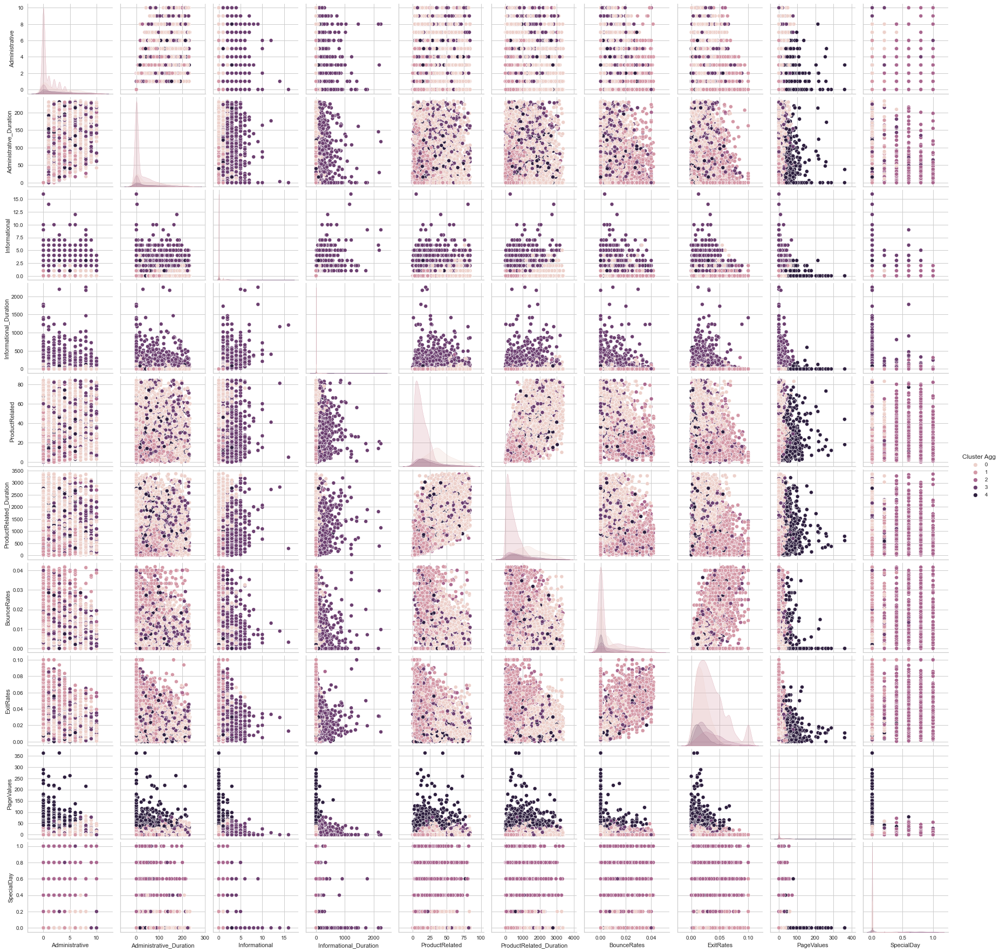

In [71]:
plt.figure(figsize= (15,20))
sns.pairplot(data= df_final.iloc[:, [0,1,2,3,4,5,6,7,8,9, 20]], hue= 'Cluster Agg')
plt.show()

In [72]:
# On Original data with outliers.

agg= AgglomerativeClustering(n_clusters= 3, linkage= 'ward')
agg.fit(num_cols_sc)

df['Cluster Agg']= agg.labels_

In [73]:
df['Cluster Agg'].value_counts()

0    9994
1    1570
2     766
Name: Cluster Agg, dtype: int64

**Interpretation:** For Agglomerative Clustering, removing outliers is necessary. So this is probably not a good model.

### DBSCAN

In [74]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_num)
distances, indices = nbrs.kneighbors(df_num)

In [75]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]

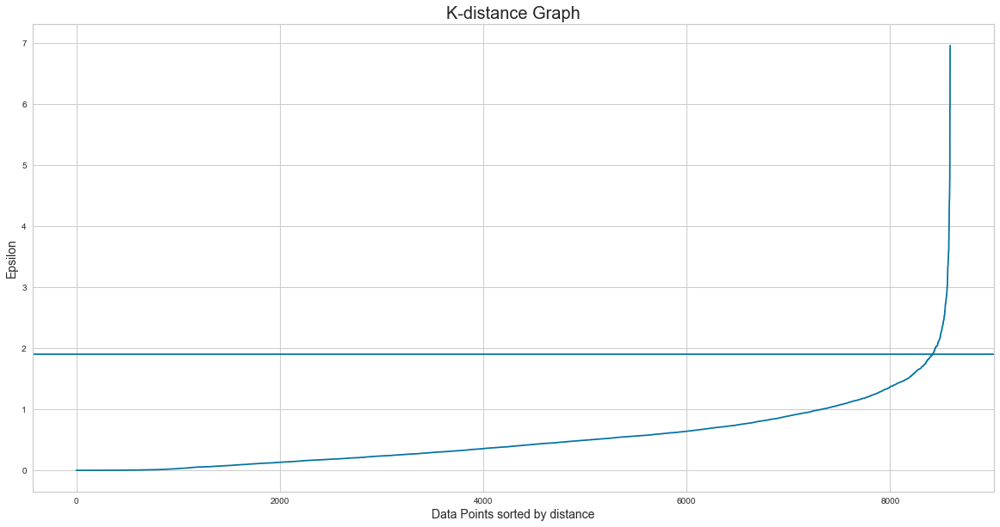

In [76]:
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.axhline(y=1.9)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

**Interpretation** According to the graph, the maximum curvature is at 1.9, so that is the optimal Epsilon value.

In [77]:
dbscan_opt= DBSCAN(eps= 1.9)
dbscan_opt.fit(num_cols_sc)

df['Cluster DB']= dbscan_opt.labels_

In [78]:
df['Cluster DB'].value_counts()

 0    12026
-1      287
 1       12
 2        5
Name: Cluster DB, dtype: int64

**Interpretation:** DBSCAN is not clustering the data points well. So we will not consider this.

## Dimensionality Reduction using PCA

In [79]:
# Reducing the Dimensions by preserving 95% data.

from sklearn.decomposition import PCA
pca= PCA(n_components= 0.95)
pca.fit_transform(df_num)

print("Number of Components:", pca.n_components_)

Number of Components: 8


In [80]:
df_pca= pd.DataFrame(pca.fit_transform(df_num), columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5','PC6','PC7','PC8'])

df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,-2.701806,0.658739,0.983956,-0.174548,-0.546129,-0.016251,2.265364,0.010619
1,-1.609184,0.882687,-0.175902,-0.455776,-0.865123,0.060221,-0.324895,0.058032
2,-1.207089,0.178818,-0.130267,0.029846,-0.437913,-0.185627,-1.094539,-0.009407
3,-3.084071,1.555479,0.150206,-0.788915,3.140554,1.360733,2.254196,-0.000484
4,-1.264014,-0.167023,-0.287470,0.497202,1.890866,0.126181,-0.113118,0.073217


In [81]:
# Reducing the Data to 2 Dimensions.

pca= PCA(n_components= 2)
pca.fit_transform(df_num)

array([[-2.70180599,  0.6587392 ],
       [-1.60918418,  0.88268745],
       [-1.20708881,  0.17881784],
       ...,
       [-1.1633928 , -0.67338514],
       [ 0.31780769, -1.06802328],
       [-2.16807062,  0.05311892]])

In [82]:
df_pca2= pd.DataFrame(pca.fit_transform(df_num), columns = ['PC1', 'PC2'])

df_pca2.head()

,PC1,PC2
0,-2.701806,0.658739
1,-1.609184,0.882687
2,-1.207089,0.178818
3,-3.084071,1.555479
4,-1.264014,-0.167023


In [83]:
# Checking optimal number of clusters using the silhouette score.

for K in range(2,11):
    cluster= KMeans(n_clusters= K)
    predict= cluster.fit_predict(df_pca2)
    score= silhouette_score(df_pca2, predict, random_state= 5)
    print("For {} clusters the silhouette score is {}".format(K, score))

For 2 clusters the silhouette score is 0.4200699417781743
For 3 clusters the silhouette score is 0.3778131732218727
For 4 clusters the silhouette score is 0.36426294742692633
For 5 clusters the silhouette score is 0.37872815609212557
For 6 clusters the silhouette score is 0.36843457398575336
For 7 clusters the silhouette score is 0.36585790293356674
For 8 clusters the silhouette score is 0.3353022525868235
For 9 clusters the silhouette score is 0.34007256209784925
For 10 clusters the silhouette score is 0.34710045360482283


**Interpretation:** According to the Silhouette Score, 2 is the optimal number of clusters.

In [84]:
k_clusters= KMeans(n_clusters= 2, random_state= 5)

k_clusters.fit(df_pca2)

df_pca2['Cluster KMeans']= k_clusters.labels_

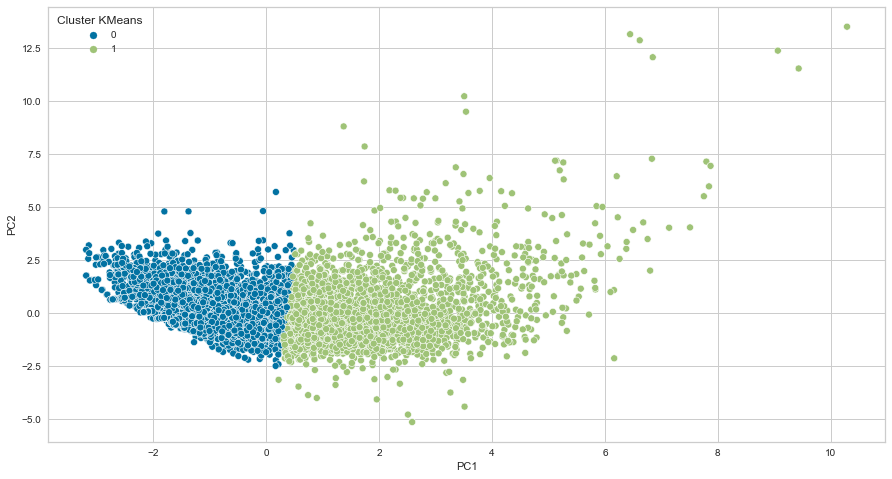

In [85]:
plt.figure(figsize= (15,8))
sns.scatterplot(x= df_pca2['PC1'], y= df_pca2['PC2'], hue= df_pca2['Cluster KMeans'])
plt.show()

In [86]:
df_final['Cluster KMeans PCA']= k_clusters.labels_

In [87]:
df_final['Cluster KMeans PCA'].value_counts()

0    5442
1    3149
Name: Cluster KMeans PCA, dtype: int64

<Figure size 1080x1440 with 0 Axes>

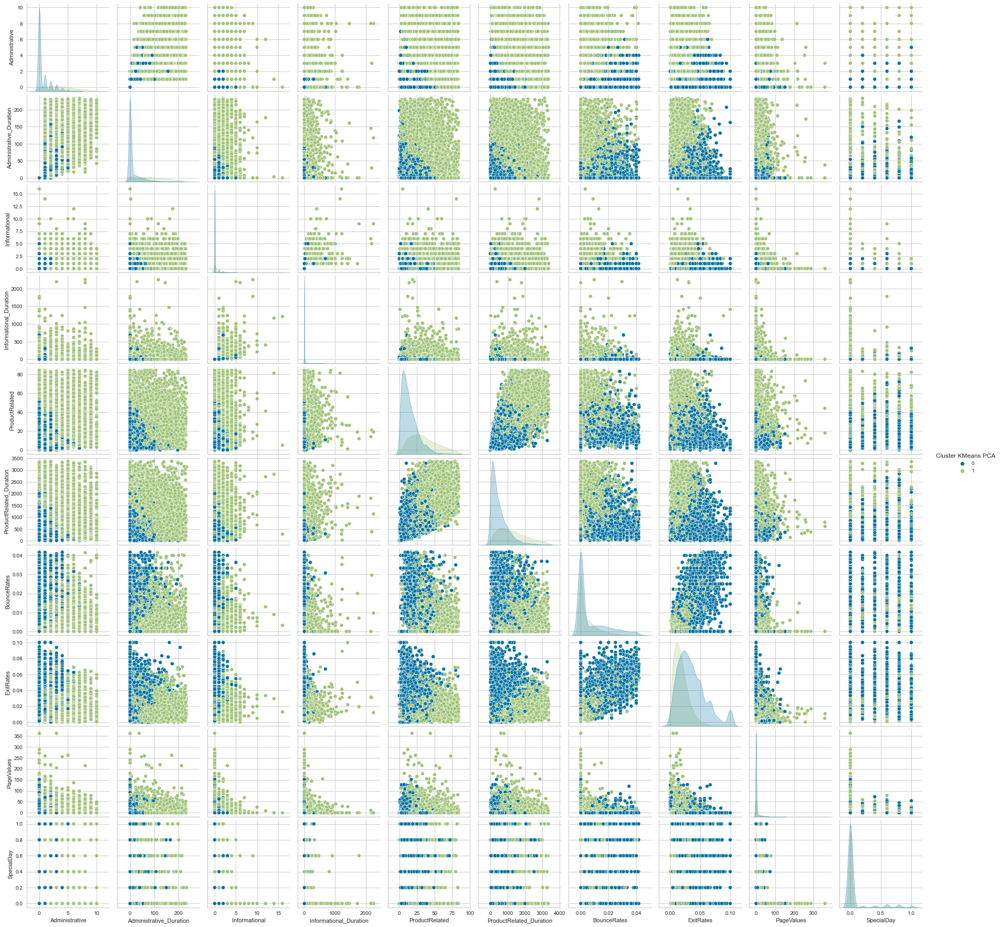

In [89]:
plt.figure(figsize= (15,20))
sns.pairplot(data= df_final.iloc[:, [0,1,2,3,4,5,6,7,8,9,21]], hue= 'Cluster KMeans PCA')
plt.show()

#### Cluster 1

In [90]:
df_final[df_final['Cluster KMeans PCA']==0].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans,Cluster KMeans 2,Cluster Agg,Cluster KMeans PCA
count,5442.000000,5442.000000,5442.000000,5442.000000,5442.000000,5442.000000,5442.000000,5442.000000,5442.000000,5442.000000,5442.000000,5442.000000,5442.000000,5442.0
mean,0.633407,13.161878,0.091878,2.867549,14.406652,494.021595,0.007439,0.036294,3.546633,0.072731,1.764057,0.991363,1.224550,0.0
std,1.139397,27.996332,0.398043,20.997624,11.113829,477.534607,0.011327,0.023611,12.951797,0.216084,0.621706,0.092539,0.840703,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.000000,0.000000,0.000000,0.000000,6.000000,142.541667,0.000000,0.018750,0.000000,0.000000,2.000000,1.000000,1.000000,0.0
50%,0.000000,0.000000,0.000000,0.000000,12.000000,343.116667,0.000000,0.032381,0.000000,0.000000,2.000000,1.000000,1.000000,0.0
75%,1.000000,12.000000,0.000000,0.000000,20.000000,692.425000,0.013333,0.050000,0.000000,0.000000,2.000000,1.000000,1.000000,0.0
max,7.000000,206.666667,5.000000,686.000000,83.000000,3291.000000,0.041945,0.100000,151.565052,1.000000,3.000000,1.000000,4.000000,0.0


In [91]:
df_final[df_final['Cluster KMeans PCA']==0].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,5442,5442,5442,5442,5442,5442,5442,5442
unique,10,8,12,9,19,3,2,2
top,May,2,2,1,2,Returning_Visitor,False,False
freq,1559,2957,3398,2094,1585,4546,4209,4851


#### Cluster 2

In [92]:
df_final[df_final['Cluster KMeans PCA']==1].describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Cluster KMeans,Cluster KMeans 2,Cluster Agg,Cluster KMeans PCA
count,3149.000000,3149.000000,3149.000000,3149.000000,3149.000000,3149.000000,3149.000000,3149.000000,3149.000000,3149.000000,3149.000000,3149.000000,3149.000000,3149.0
mean,3.563353,86.167073,0.817085,54.787039,35.298507,1284.448949,0.004834,0.017963,11.171746,0.028009,1.227374,0.071769,1.175611,1.0
std,2.588375,64.275824,1.456554,163.523634,19.670098,808.775828,0.007300,0.012142,27.532720,0.132766,0.671909,0.258146,1.475110,0.0
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,1.000000,33.000000,0.000000,0.000000,20.000000,630.000000,0.000000,0.009069,0.000000,0.000000,1.000000,0.000000,0.000000,1.0
50%,3.000000,78.750000,0.000000,0.000000,32.000000,1170.733333,0.000000,0.015646,0.000000,0.000000,1.000000,0.000000,0.000000,1.0
75%,5.000000,134.000000,1.000000,29.500000,49.000000,1836.775000,0.007407,0.024242,10.259510,0.000000,1.000000,0.000000,3.000000,1.0
max,10.000000,233.083333,16.000000,2252.033333,84.000000,3382.083333,0.041463,0.100000,361.763742,1.000000,3.000000,1.000000,4.000000,1.0


In [93]:
df_final[df_final['Cluster KMeans PCA']==1].describe(include= object)

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
count,3149,3149,3149,3149,3149,3149,3149,3149
unique,10,7,12,9,18,3,2,2
top,Nov,2,2,1,2,Returning_Visitor,False,False
freq,789,1752,2043,1190,1316,2515,2322,2404


**Interpretation:** Yes, the PCA model is helping in clustering as it is making the data more visualizable by converting it into a 2-Dimensional data.

* The 2 Clusters created can help the business to make decisions on how to target the two different segments.
* This can be done by studying the characteristics of the 2 clusters.

In [94]:
for K in range(2,11):
    cluster= KMeans(n_clusters= K)
    predict= cluster.fit_predict(df_pca)
    score= silhouette_score(df_pca, predict, random_state= 5)
    print("For {} clusters the silhouette score is {}".format(K, score))

For 2 clusters the silhouette score is 0.2531319760658518
For 3 clusters the silhouette score is 0.22686228923998641
For 4 clusters the silhouette score is 0.23181836374527792
For 5 clusters the silhouette score is 0.2544452924148479
For 6 clusters the silhouette score is 0.24612383890766282
For 7 clusters the silhouette score is 0.25974344905097385
For 8 clusters the silhouette score is 0.26396616655014515
For 9 clusters the silhouette score is 0.269388106130359
For 10 clusters the silhouette score is 0.2656616124537532


In [95]:
k_clusters= KMeans(n_clusters= 9, random_state= 5)

k_clusters.fit(df_pca)

df_pca['Cluster KMeans']= k_clusters.labels_
df_final['Cluster KMeans PCA 8']= k_clusters.labels_

In [96]:
df_final['Cluster KMeans PCA 8'].value_counts()

4    2822
7    1432
1    1174
8    1070
2     783
3     528
5     394
0     336
6      52
Name: Cluster KMeans PCA 8, dtype: int64

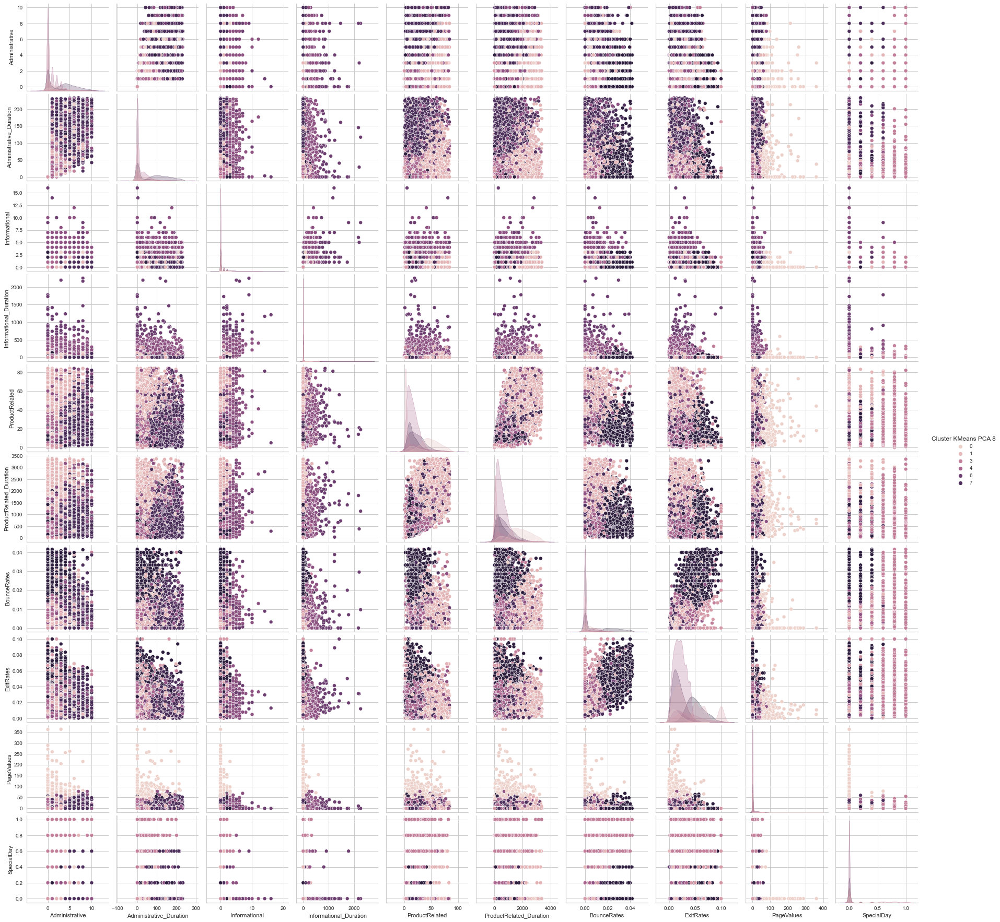

In [97]:
sns.pairplot(data= df_final.iloc[:, [0,1,2,3,4,5,6,7,8,9,22]], hue= 'Cluster KMeans PCA 8');